**Group member details are as follows:- **<br>
**1. Amrit Kaur (matriculation no. - 3055863)**<br>
**2. Pratik Kumar Agarwal (matriculation no. - 3056132) **

In [44]:
# http://pytorch.org/
from os.path import exists
from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())
cuda_output = !ldconfig -p|grep cudart.so|sed -e 's/.*\.\([0-9]*\)\.\([0-9]*\)$/cu\1\2/'
accelerator = cuda_output[0] if exists('/dev/nvidia0') else 'cpu'

!pip install -q http://download.pytorch.org/whl/{accelerator}/torch-0.4.1-{platform}-linux_x86_64.whl torchvision
import torch

  HTTP error 403 while getting http://download.pytorch.org/whl/cu100/torch-0.4.1-cp36-cp36m-linux_x86_64.whl
  Could not install requirement torch==0.4.1 from http://download.pytorch.org/whl/cu100/torch-0.4.1-cp36-cp36m-linux_x86_64.whl because of error 403 Client Error: Forbidden for url: http://download.pytorch.org/whl/cu100/torch-0.4.1-cp36-cp36m-linux_x86_64.whl
Could not install requirement torch==0.4.1 from http://download.pytorch.org/whl/cu100/torch-0.4.1-cp36-cp36m-linux_x86_64.whl because of HTTP error 403 Client Error: Forbidden for url: http://download.pytorch.org/whl/cu100/torch-0.4.1-cp36-cp36m-linux_x86_64.whl for URL http://download.pytorch.org/whl/cu100/torch-0.4.1-cp36-cp36m-linux_x86_64.whl


In [0]:
import torch
import torchvision
from torch.autograd import Variable
import torch.nn as nn
from torch.optim import lr_scheduler
import torchvision.transforms as transforms
from torch.utils.data.dataset import Dataset
from torchvision import datasets
import matplotlib.pyplot as plt
import matplotlib.image
from skimage import io, transform
import numpy as np
import os
import pandas as pd
from scipy.stats import multivariate_normal
from PIL import Image
import math
import cv2 as cv
import zipfile
%matplotlib inline

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

plt.ion() #interactive mode

In [3]:
!pip install pillow==4.1.1
%reload_ext autoreload
%autoreload

In [0]:
data_dir = os.getcwd()

**In the 'imageset_430.zip' we have all the images for training our sweaty model i.e. class encoder_decoder. So we are just unzipping it here**

In [0]:
img_folder1 = "1"
data1= "imageset_430"
data_folder1 = os.path.join(data_dir,img_folder1,data1)
if not os.path.exists(data_folder1):
  os.mkdir(os.path.join(data_dir,img_folder1))
  os.mkdir(data_folder1)
zip_handler = zipfile.ZipFile("imageset_430.zip","r")
zip_handler.extractall(data_folder1)

**In the Below cell, we are reading the mentioned .txt file.  <br>
In this file we have the coordinates of the ball i.e where the ball is in the image. <br>
And for the images where ball is not there, we have mentioned it as 'not_in_image' **

In [0]:
data_frame = pd.read_csv('train_val_encoder_decoder_dataset.txt', skiprows=4)


**In the below cell, In the Datasets class we are creating the target labels for our images. And returning objects which has  both the images and its respective target label together<br>**

*   **We are making a matrix of zeros; of size 128\*160  because as our image size is 512*640  which is quite big so      have downsampled it and made it 1/4th. <br> **

*   **Using ''multivariate_normal.pdf'' function we are generating probability values and assigning it to our target label only at that location where the ball is and in rest of the places all the values are Zero.<br>**

*   **And if there is no ball in the image then our target label will be of all zeros.**








In [0]:
class Datasets(Dataset):
  def __init__(self, csv_path, image_folder_path, transforms=None):
    '''
        Args:
            csv_path (string): path to csv file
            image_folder_path (string): path to the folder where images are
            transform: pytorch transforms for transforms and tensor conversion
    '''
    # Read the csv file
    self.landmarks_frame = pd.read_csv(csv_path,skiprows=4 )
    self.image_folder_path = image_folder_path
    self.transforms = transforms
    self.label =  np.zeros((128,160)) 
    self.img_as_tensor =  np.zeros((640,512)) 
    
  def __getitem__(self, n=3):
    mean = []
    img_name = self.landmarks_frame.iloc[n, 0].split('|')[1]
    if(self.landmarks_frame.iloc[n, 0].split('|')[2] == 'not_in_image'):
      self.label = np.zeros((128,160))     #For those images where ball is not there we are making the target label empty.
    else:
      image_width = int(self.landmarks_frame.iloc[n, 0].split('|')[2])
      image_height = int(self.landmarks_frame.iloc[n, 0].split('|')[3])
      x1 = int(self.landmarks_frame.iloc[n, 0].split('|')[4])
      y1 = int(self.landmarks_frame.iloc[n, 0].split('|')[5])
      x2 = int(self.landmarks_frame.iloc[n, 0].split('|')[6])
      y2 = int(self.landmarks_frame.iloc[n, 0].split('|')[7])
      
      mean.append((math.ceil(x1/4)+math.ceil(x2/4))/2)
      mean.append((math.ceil(y1/4)+math.ceil(y2/4))/2)
  
      target_matrix = np.zeros((128,160))
      var_ = int((x2-int((x1+x2)//2))//4)
  
      for x in range(math.ceil(x1/4)-1,math.ceil(x2/4)+1):
        for y in range(math.ceil(y1/4)-1,math.ceil(y2/4)+1):
          if (x==160):
            x-=1
          if (y==128):
            y-=1
          target_matrix[y, x] = 100 * multivariate_normal.pdf([x,y], mean, [6, 6])   #Assigning probability values only at that location where we have ball
        
      self.label = target_matrix
    
    img_location = os.path.join(str(self.image_folder_path),img_name)
    img = Image.open(img_location)
    img = img.resize((640,512))
    if self.transforms is not None:
      self.img_as_tensor = self.transforms(img)
    
    return((self.img_as_tensor, self.label))         #Returning images and its target label combined

  def __len__(self):
    return len(self.landmarks_frame)


**In the below cell we are calling our Datasets class (defined above) for creating target labels and returning the values**

In [0]:
transformations = transforms.Compose([transforms.ToTensor()])
datasets = Datasets('train_val_encoder_decoder_dataset.txt', os.path.join(data_dir,img_folder1,data1), transformations)

In [9]:
print(len(datasets))

1876


In [10]:
#set hyperparameters
batch_size = 20
learning_rate=0.001

from sklearn.model_selection import train_test_split
X_train, X_val = train_test_split(datasets, test_size=0.33, random_state=42)
cuda = torch.cuda.is_available()
print(cuda)

# Define data loader
train_loader = torch.utils.data.DataLoader(dataset=X_train,
                                                    batch_size=batch_size,
                                                    shuffle=True)
val_loader = torch.utils.data.DataLoader(dataset=X_val, batch_size=batch_size,shuffle=False)


True


**In the below cell, We are using 'train_test_split function' to split our data into training set and validation set (In 70,30 ratio) and creating our train and val loader**


In [11]:
len(X_train), len(X_val)

(1256, 620)

torch.Size([20, 3, 512, 640]) torch.Size([20, 128, 160])


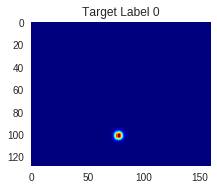

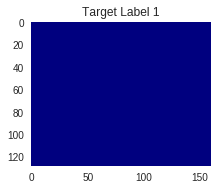

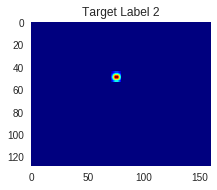

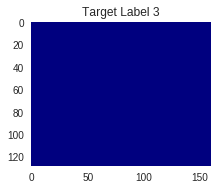

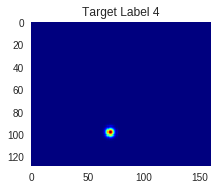

...

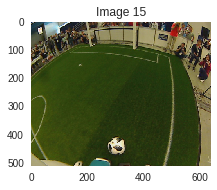

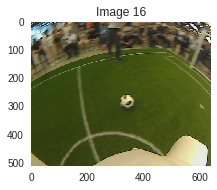

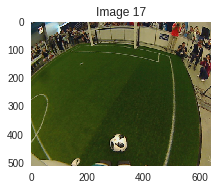

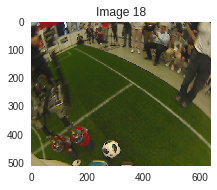

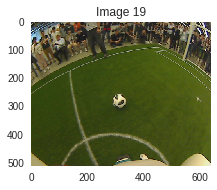

In [0]:
#Visualising images and the target matrix created for a batch_size = 20 images
for images,labels in train_loader:
  j = 0
  print(images.shape, labels.shape)
  for i in range(labels.shape[0]*2):
    plt.figure(figsize=(10,10))
    plt.subplot(8,labels.shape[0]/4,i+1)
    plt.subplots_adjust(right=1.8, top=2.0)
    if i <= labels.shape[0]-1:      
      plt.imshow(labels[i].reshape(128,160),cmap='jet')   #Visualizing the target label first
      plt.title('Target Label {}'.format(i))
      plt.grid(False)
    else:
      tensor = images.detach().cpu().numpy()
      plt.imshow(tensor[j].transpose((1,2,0)))  #Visualizing target label's respective image
      plt.title('Image {}'.format(j))
      plt.grid(False)
      j += 1
   
  break
      
 

**In the below cell, we have created our encoder_decoder model. Here, we are using sweaty model-1**<br>


In [0]:
# Encoder 
# torch.nn.Conv2d(in_channels, out_channels, kernel_size,
#                 stride=1, padding=0, dilation=1,
#                 groups=1, bias=True)
# batch x 640 * 512 * 3 -> batch x 983040

class Encoder_Decoder(nn.Module):
  def __init__(self):
    super(Encoder_Decoder,self).__init__()
    self.layer1 = nn.Sequential(
        nn.Conv2d(3, 8, 3, padding = 1), # 640 * 512 * 8
        nn.BatchNorm2d(8),
        nn.ReLU()
   ) 
    self.maxpool1 = nn.MaxPool2d(2,2) # 320 * 256 * 8
    self.layer2 = nn.Sequential(
        nn.Conv2d(8, 16, 3, padding = 1), # 320 * 256 * 16
        nn.BatchNorm2d(16),
        nn.ReLU(),
        nn.Conv2d(16, 16, 3, padding = 1), # 320 * 256 * 16
        nn.BatchNorm2d(16),
        nn.ReLU()
   )
    self.maxpool2 = nn.MaxPool2d(2,2) # 160 * 128 * 16
    self.layer3 = nn.Sequential(
        nn.Conv2d(24, 32, 3, padding = 1), # 160 * 128 * 32
        nn.BatchNorm2d(32),
        nn.ReLU(),
        nn.Conv2d(32, 32, 3, padding = 1), # 160 * 128 * 32
        nn.BatchNorm2d(32),
        nn.ReLU()
   ) 
    self.maxpool3 =  nn.MaxPool2d(2,2) # 80 * 64 * 32
    self.layer4 = nn.Sequential(
        nn.Conv2d(56, 64, 3, padding = 1), # 80 * 64 * 64
        nn.BatchNorm2d(64),
        nn.ReLU(),
        nn.Conv2d(64, 64, 3, padding = 1), # 80 * 64 * 64
        nn.BatchNorm2d(64),
        nn.ReLU(),
        nn.Conv2d(64, 64, 3, padding = 1), # 80 * 64 * 64
        nn.BatchNorm2d(64),
        nn.ReLU()
   ) 
    self.maxpool4 = nn.MaxPool2d(2,2) # 40 * 32 * 64
    self.layer5 = nn.Sequential(
        nn.Conv2d(120, 128, 3, padding = 1), # 40 * 32 * 128
        nn.BatchNorm2d(128),
        nn.ReLU(),
        nn.Conv2d(128, 128, 3, padding = 1), # 40 * 32 * 128
        nn.BatchNorm2d(128),
        nn.ReLU(),
        nn.Conv2d(128, 128, 3, padding = 1), # 40 * 32 * 128
        nn.BatchNorm2d(128),
        nn.ReLU(),
        nn.Conv2d(128, 64, 3, padding = 1), # 40 * 32 * 64
        nn.BatchNorm2d(64),
        nn.ReLU()
    )
    self.upsampling1 = nn.UpsamplingBilinear2d(size=(80,64)) # 80 * 64 * 64
    self.layer6 = nn.Sequential(
        nn.Conv2d(184, 64,kernel_size=1,stride=1,padding=1//2), # 80 * 64 * 64
        nn.BatchNorm2d(64),
        nn.ReLU(),
        nn.Conv2d(64, 32,kernel_size=3,stride=1,padding = 3//2), # 80 * 64 * 32
        nn.BatchNorm2d(32),
        nn.ReLU(),
        nn.Conv2d(32, 32,kernel_size=3,stride=1,padding = 3//2), # 80 * 64 * 32
        nn.BatchNorm2d(32),
        nn.ReLU()
    )
    self.upsampling2 =  nn.UpsamplingBilinear2d(size=(160,128)) # 160 * 128 * 32
    self.layer7 = nn.Sequential( 
        nn.Conv2d(88, 16,kernel_size=1,stride=1, padding = 1//2), # 160 * 128 * 16
        nn.BatchNorm2d(16),
         nn.ReLU(),
        nn.Conv2d(16, 16,kernel_size=3,stride=1, padding = 3//2), # 160 * 128 * 16
        nn.BatchNorm2d(16),
        nn.ReLU(),
        nn.Conv2d(16, 1, kernel_size=3,stride=1, padding = 3//2), # 160 * 128 * 1    TODO
        nn.BatchNorm2d(1),
        nn.ReLU()
    )
    
  def forward(self,x):
    batch_size = x.shape[0]
    out = self.layer1(x)
    out_cat1 = self.maxpool1(out)
    out = self.layer2(out_cat1)
    out = torch.cat((out_cat1,out),1)
    out_cat2 = self.maxpool2(out)
    out = self.layer3(out_cat2)
    out_cat3 = torch.cat((out_cat2,out),1) # to be used later for decoder
    out_cat4 = self.maxpool3(out_cat3)
    out = self.layer4(out_cat4)
    out_cat5 = torch.cat((out_cat4,out),1) # to be used later for decoder
    out = self.maxpool4(out_cat5)
    out = self.layer5(out)
    out = self.upsampling1(out)
    out_cat5 = out_cat5.view(batch_size,120,80,64)    #here we have swapped the last two values
    out = torch.cat((out_cat5,out),1)   
    out = self.layer6(out)
    out = self.upsampling2(out)
    out_cat3 = out_cat3.view(batch_size,56,160,128)
    out = torch.cat((out_cat3,out),1)
    out = self.layer7(out)
    out = out.view(batch_size,128,160)
    return out

if cuda:
  encoder_decoder = Encoder_Decoder().cuda()
else:
  encoder_decoder = Encoder_Decoder()

In [0]:
def min_max_normalization(tensor, min_value, max_value):
    min_tensor = tensor.min()
    tensor = (tensor - min_tensor)
    max_tensor = tensor.max()
    tensor = tensor / max_tensor
    tensor = tensor * (max_value - min_value) + min_value
    return tensor

In [0]:
EPOCH = 101

In [0]:
# train encoder and decoder
# save and load model

def train_encoder_decoder(loss_func,optimizer):
  
  for epoch in range(EPOCH):
    for images,labels in train_loader:
      
      if cuda:
        images = Variable(images).cuda()
        labels = Variable(labels.float()).cuda()
      else:
        images = Variable(images)
        labels = Variable(labels.float())
      
      # Clear gradients w.r.t. parameters
      optimizer.zero_grad()
      
      # Forward pass to get latent representation
      output = encoder_decoder(images)
      
      # Calculate Loss: MSEloss
      loss = loss_func(output,labels)
      
      # Getting gradients w.r.t. parameters
      loss.backward()
      
      # Updating parameters
      optimizer.step()
      
      if cuda:
        output=Variable(output).cuda()
      else:
        output = Variable(output)
 
    if (epoch==EPOCH-1):
      outputs_normalized = min_max_normalization(output,0,1)
      j = 0
      k = 0
      for i in range(labels.shape[0]*3):
        plt.figure(figsize=(40, 40))
        plt.subplot(3,labels.shape[0],i+1)
        plt.subplots_adjust(right=1.8, top=2.0)
        if i <= labels.shape[0]-1: 
          plt.imshow(labels[i].cpu().reshape(128,160),cmap='jet')    # First image is Target label 
          plt.title('Target label Train Dataset: {}'.format(i))
          plt.grid(False)
          plt.show()
        elif(i>labels.shape[0]-1 and i<=labels.shape[0]+labels.shape[0]-1):
          #outputs_ = outputs_normalized.detach().cpu().numpy()
          plt.imshow(outputs_normalized[k].cpu().reshape(128,160),cmap='jet')    # Second image is our model output 
          plt.title('Model Output Train Dataset : {}'.format(k))
          plt.grid(False)
          plt.show()
          k += 1
        else:
          tensor = images.detach().cpu().numpy()
          plt.imshow(tensor[j].transpose((1,2,0)))    # Actual Image
          plt.title('Image Train Dataset: {}'.format(j))
          plt.grid(False)
          plt.show()
          j += 1     
    
    if(epoch%20==0): 
      print('epoch {}, Train loss {} '.format(epoch,loss))
      val_encoder_decoder(epoch,loss_func)

In [0]:
def val_encoder_decoder(epoch,loss_func):
  for images,labels in val_loader:
    #print(images.shape,labels.shape)
    if cuda:
      images=Variable(images).cuda()
      labels=Variable(labels.float()).cuda()
    else:
      images = Variable(images)
      labels=Variable(labels.float())
      
    outputs = encoder_decoder(images)
    if cuda:
      outputs=Variable(outputs).cuda()
    else:
      outputs = Variable(outputs)
  
  loss = loss_func(outputs,labels)
  print('epoch {}, Validation loss {} '.format(epoch,loss))
  if (epoch == EPOCH-1):
    j = 0
    k = 0
    for i in range(labels.shape[0]*3):
      plt.figure(figsize=(40, 40))
      plt.subplot(3,labels.shape[0],i+1)
      plt.subplots_adjust(right=1.8, top=2.0)
      if i <= labels.shape[0]-1: 
        plt.title('Target Labels Validation Dataset:{} '.format(i))
        plt.imshow(labels[i].cpu().reshape(128,160),cmap='jet')
        plt.grid(False)
      elif(i>labels.shape[0]-1 and i<=labels.shape[0]+labels.shape[0]-1):
        #outputs_ = outputs.detach().cpu().numpy()
        plt.title('Model Output Validation Dataset:{}'.format(k))
        plt.imshow(outputs[k].cpu().reshape(128,160),cmap='jet')
        plt.grid(False)
        k += 1
      else:
        tensor = images.detach().cpu().numpy()
        plt.imshow(tensor[j].transpose((1,2,0)))
        plt.title('image Validation Dataset:{}'.format(j))
        plt.grid(False)
        j += 1

In [0]:
def execution():
  # loss func and optimizer
  # we compute reconstruction after decoder so use Mean Squared Error
  # In order to use multi parameters with one optimizer,
  # concat parameters after changing into list

  parameters=encoder_decoder.parameters()
  loss_func=nn.MSELoss()
  optimizer=torch.optim.Adam(parameters, lr= learning_rate)
  print("TrainEncoderDecoder for 101 epochs:")
  train_encoder_decoder(loss_func,optimizer)

**In the below cell, we are showing result of 101 epochs on train_loader.
After every 20 epochs, we also check our loss on validation set.
**

**In the final epoch, we are showing the output for both train set and validation set for the last batch**
*   **First 20 images are the target labels**
*   **Next 20 images are our model output**
*   **Then the actual image**



TrainEncoderDecoder for 101 epochs:
epoch 0, Train loss 0.00035230693174526095 
epoch 0, Validation loss 0.00045490593765862286 
epoch 20, Train loss 2.044129723799415e-05 
epoch 20, Validation loss 0.0004619817773345858 
epoch 40, Train loss 1.1777638974308502e-05 
epoch 40, Validation loss 0.00042360398219898343 
epoch 60, Train loss 0.00035635739914141595 
epoch 60, Validation loss 0.00045475445222109556 
epoch 80, Train loss 1.2018090274068527e-05 
epoch 80, Validation loss 0.0004452466091606766 


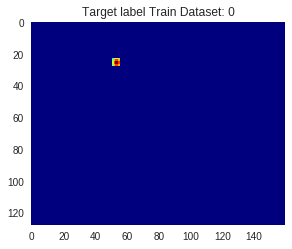

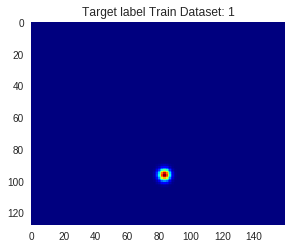

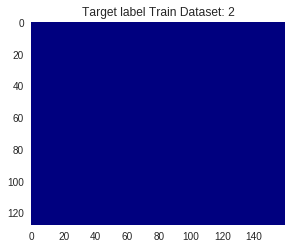

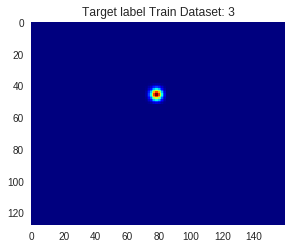

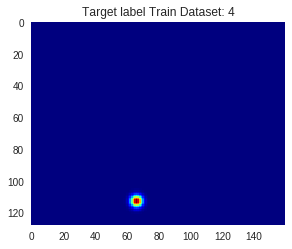

...

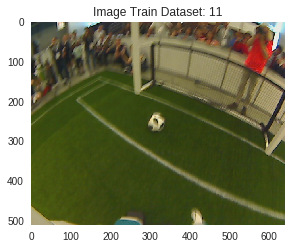

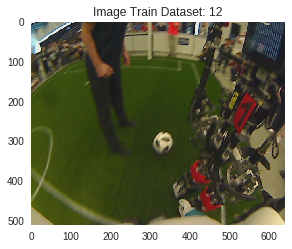

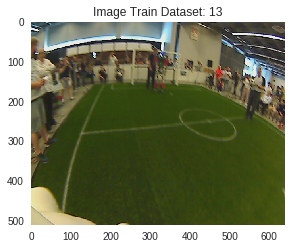

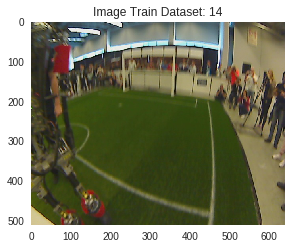

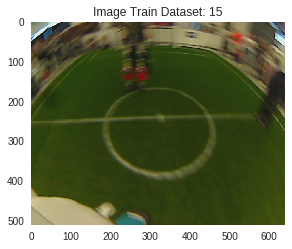

epoch 100, Train loss 1.7208378267241642e-05 
epoch 100, Validation loss 0.00045618557487614453 


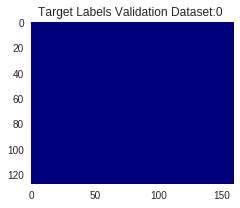

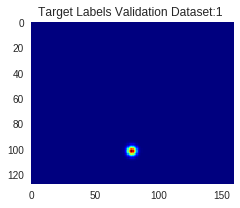

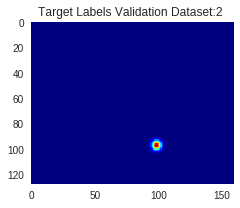

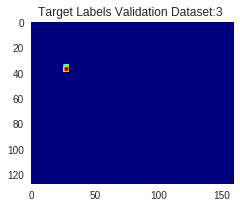

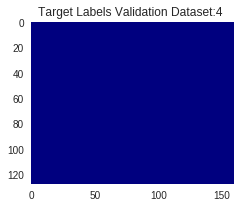

...

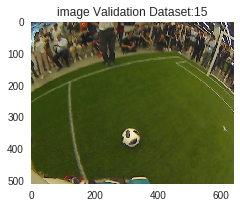

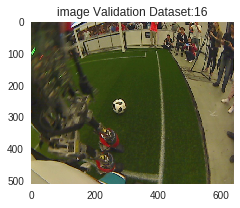

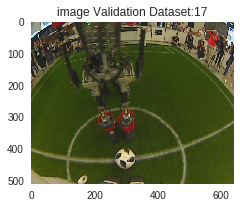

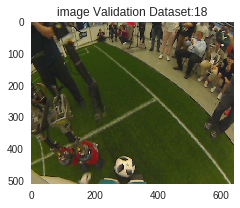

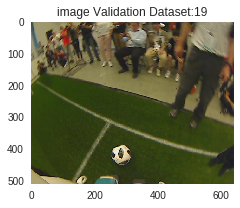

In [79]:
execution()

In [80]:
print(encoder_decoder)

Encoder_Decoder(
  (layer1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (maxpool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (layer2): Sequential(
    (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
  )
  (maxpool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (layer3): Sequential(
    (0): Conv2d(24, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): 

In [0]:
#Save the encoder_decoder model
import pickle
with open ('model_pickle.pkl','wb') as f:
  pickle.dump(encoder_decoder,f)

In [0]:
#Load the saved model
with open('model_pickle.pkl','rb') as f:
  model = pickle.load(f)

**Implementing the ConvLSTM model**

In [0]:
class ConvLSTMCell(nn.Module):
  def __init__(self,input_size,input_dim,hidden_dim,kernel_size,bias):
    """
        Initialize ConvLSTM cell.
        
        Parameters
        ----------
        input_size: (int, int)
            Height and width of input tensor as (height, width).
        input_dim: int
            Number of channels of input tensor.
        hidden_dim: int
            Number of channels of hidden state.
        kernel_size: (int, int)
            Size of the convolutional kernel.
        bias: bool
            Whether or not to add the bias.
     """
    super(ConvLSTMCell,self).__init__()
    self.height,self.width = input_size    
    self.input_dim = input_dim   #no of channels = 1
    self.hidden_dim = hidden_dim   #output channel of conv layer
    self.kernel_size = kernel_size   
    self.padding = kernel_size[0]//2, kernel_size[1]//2
    self.bias = bias
    self.conv = nn.Conv2d(in_channels = self.input_dim + self.hidden_dim,
                          out_channels = 4*self.hidden_dim,
                          kernel_size = self.kernel_size,
                          padding = self.padding,
                          bias = self.bias
                         )
    
  def init_hidden(self, batch_size):
    return ((Variable(torch.zeros(batch_size, self.hidden_dim, self.height, self.width)).cuda(),
                Variable(torch.zeros(batch_size, self.hidden_dim, self.height, self.width)).cuda()))
    
  def forward(self, input_tensor,cur_state):
    h_cur,c_cur = cur_state
    combined = torch.cat([input_tensor, h_cur], dim = 1) # concatenate along channel axis
    combined_conv = self.conv(combined)
    cc_i,cc_f,cc_o,cc_g = torch.split(combined_conv,self.hidden_dim, dim=1)
    i = torch.sigmoid(cc_i)
    f = torch.sigmoid(cc_f)
    o = torch.sigmoid(cc_o)
    g = torch.tanh(cc_g)
      
    c_next = f*c_cur + i*g
    h_next = o*torch.tanh(c_next)
      
    return h_next,c_next

In [0]:
class ConvLSTM(nn.Module):
  def __init__(self, input_size, input_dim,hidden_dim, kernel_size, num_layers,batch_first=False,bias=True,return_all_layers=False):
    super(ConvLSTM, self).__init__()
    self._check_kernel_size_consistency(kernel_size)
    # Make sure that both `kernel_size` and `hidden_dim` are lists having len == num_layers
      
    kernel_size = self._extend_for_multilayer(kernel_size,num_layers)
    hidden_dim = self._extend_for_multilayer(hidden_dim,num_layers)
    if not len(kernel_size)== len(hidden_dim) == num_layers:
      raise ValueError('Inconsistent list length')
        
    self.height,self.width = input_size
      
    self.input_dim = input_dim
    self.hidden_dim = hidden_dim
    self.kernel_size = kernel_size
    self.num_layers = num_layers
    self.batch_first = batch_first
    self.bias = bias
    self.return_all_layers = return_all_layers
      
    cell_list = []
    for i in range(0,self.num_layers):
      cur_input_dim = self.input_dim if i == 0 else self.hidden_dim[i-1]
      cell_list.append(ConvLSTMCell(input_size=(self.height,self.width),
                                     input_dim = cur_input_dim,
                                     hidden_dim = self.hidden_dim[i],
                                     kernel_size = self.kernel_size[i],
                                     bias = self.bias))
      
      
    self.cell_list=nn.ModuleList(cell_list)
  def forward(self,input_tensor,hidden_state = None):
    """
        
        Parameters
        ----------
        input_tensor: todo 
            5-D Tensor either of shape (t, b, c, h, w) or (b, t, c, h, w)
        hidden_state: todo
            None. todo implement stateful
            
        Returns
        -------
        last_state_list, layer_output
    """
    #print(input_tensor.shape)
      
    if not self.batch_first:
      # (t, b, c, h, w) -> (b, t, c, h, w)
      input_tensor = input_tensor.permute(1,0,2,3,4)
        
    # Implement stateful ConvLSTM
    if hidden_state is not None:
      raise NotImplementedError()
    else:
      hidden_state = self._init_hidden(batch_size = input_tensor.size(0))
       
    layer_output_list = []
    last_state_list = []
      
    seq_len = input_tensor.size(1)
    cur_layer_input = input_tensor
      
    for layer_idx in range(self.num_layers):
      h,c = hidden_state[layer_idx]
      output_inner = []
      for t in range(seq_len):
        h,c = self.cell_list[layer_idx](input_tensor = cur_layer_input[:,t,:,:,:],
                                         cur_state = [h,c])
        output_inner.append(h)
        
      layer_output = torch.stack(output_inner, dim = 1)
      cur_layer_input = layer_output
        
      layer_output_list.append(layer_output)
      last_state_list.append([h,c])
        
      
    if not self.return_all_layers:
      layer_output_list = layer_output_list[-1:]
      last_state_list = last_state_list[-1:]
       
    return layer_output_list, last_state_list
    
  def _init_hidden(self, batch_size):
    init_states = []
    for i in range(self.num_layers):
      init_states.append(self.cell_list[i].init_hidden(batch_size))
    return init_states
    
  @staticmethod
  def _check_kernel_size_consistency(kernel_size):
    if not (isinstance(kernel_size, tuple) or
                    (isinstance(kernel_size, type(list)) and all([isinstance(elem, type(tuple)) for elem in kernel_size]))):
      raise ValueError('kernel_size must be tuple or list of tuples')
           
  @staticmethod
  def _extend_for_multilayer(param,num_layers):
    if not isinstance(param,list):
      param = [param]*num_layers
    return param

**Preparing Dataset for training convLSTM **

In [0]:
data_dir = os.getcwd()
img_folder2 = "2"
data2 = "imageset_431"
data_folder_trainconvlstm = os.path.join(data_dir,img_folder2,data2)
if not os.path.exists(data_folder_trainconvlstm):
  os.mkdir(os.path.join(data_dir,img_folder2))
  os.mkdir(data_folder_trainconvlstm)
zip_handler = zipfile.ZipFile("imageset_431.zip","r")
zip_handler.extractall(data_folder_trainconvlstm)

In [0]:
transformations_convlstm = transforms.Compose([transforms.ToTensor()])
datasets_train_convlstm_stackencoderdecoder = Datasets('train_convlstm.txt',os.path.join(data_dir,img_folder2,data2), transformations_convlstm)

In [14]:
print(len(datasets_train_convlstm_stackencoderdecoder))

935


In [0]:
convlstm = ConvLSTM((128,160),1,[20,1],(3,3),2,batch_first=True,bias=True,return_all_layers=False)
if cuda:
  convlstm = convlstm.cuda()
parameters_convlstm = convlstm.parameters()
loss_fn=nn.MSELoss()
optimizer_convlstm=torch.optim.Adam(parameters_convlstm, lr= learning_rate)

**The prepared dataset containing images and target labels is given as input to the trained sweatynet-1 model for only 1 epoch. And we stack the output produced and target labels together as one tuple. The stacked tensor becomes input for training our convLSTM model**

In [0]:
def stack_encoder_decoder_output(datasets):
  batch_size = 1
  # Define data loader
  data_loader_convlstm = torch.utils.data.DataLoader(dataset=datasets,
                                                    batch_size=batch_size,
                                                    shuffle=False)
  conv_lstm_dataset = ()
  k = 0
  for images,labels in data_loader_convlstm:
    if cuda:
      images = Variable(images).cuda()
      labels = Variable(labels.float()).cuda()
    else:
      images = Variable(images)
      labels = Variable(labels.float())
    # Forward pass to get latent representation
    output = model(images)
      
    if cuda:
      output=Variable(output).cuda()
    else:
      output = Variable(output)  
      
    stack_data = ((output,labels))
    conv_lstm_dataset += (stack_data,)
        
  return conv_lstm_dataset

In [0]:
def visualise_stacked_output(output,labels):
  j = 0
  k = 0
  for i in range(labels.shape[0]*2):
    plt.figure(figsize=(3, 3))
    plt.subplot(3,labels.shape[0],i+1)
    plt.subplots_adjust(right=1.8, top=2.0)
    if i <= labels.shape[0]-1:      
      plt.imshow(labels[i].cpu().reshape(128,160),cmap='jet')    # First image is Target label 
      plt.title('Target label:{}'.format(i))
      plt.grid(False)
      plt.show()
    elif(i>labels.shape[0]-1 and i<=labels.shape[0]+labels.shape[0]-1):
      #outputs_ = outputs_normalized.detach().cpu().numpy()
      plt.imshow(output[k].cpu().reshape(128,160),cmap='jet')    # Second image is our model output 
      plt.title('Model Output :{}'.format(k))
      plt.grid(False)
      plt.show()
      k += 1
      

**Visualising encoder decoder stacked tensors final batch(batch size = 1). This tensor will serve as input for convlstm model**

Visualise input to convlstm model


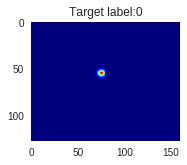

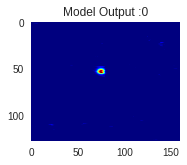

In [19]:
batch_size = 1
conv_lstm_traindataset = stack_encoder_decoder_output(datasets_train_convlstm_stackencoderdecoder)
print("Visualise input to convlstm model")
visualise_stacked_output(conv_lstm_traindataset[-1][0],conv_lstm_traindataset[-1][1])
# Define convlstm data loader
conv_lstm_trainloader = torch.utils.data.DataLoader(dataset=conv_lstm_traindataset,
                                                    batch_size=batch_size,
                                                    shuffle=False)

In [20]:
print(len(conv_lstm_traindataset))

935


In [0]:
def train_conv_lstm():
  
  #batch,channel,height,width = 1,1,128,160 for input
  seq_len = 10          # sequence length
  EPOCH = 101
  step = 0
  for epoch in range(EPOCH):
    i=0
    for inputs,labels in conv_lstm_trainloader:
      # Clear gradients w.r.t. parameters
      convlstm.zero_grad()
      optimizer_convlstm.zero_grad()
      
      hidden_state = None
      k=i
      
      for j in range(seq_len-1):
        k=k+1
        if k<len(conv_lstm_traindataset):
          inputs = torch.cat([inputs,conv_lstm_traindataset[k][0].unsqueeze(0)],dim = 0)
          labels = torch.cat([labels,conv_lstm_traindataset[k][1].unsqueeze(0)],dim = 0)
     
      labels = labels[-1:] # 1*1*128*160
      inputs = inputs.unsqueeze(0) # 5-D input tensor 1*10*1*128*160
      out = convlstm(inputs,hidden_state)
      model_output = out[1][0][0]
      loss = loss_fn(model_output,labels)
                          
      # Getting gradients w.r.t. parameters
      loss.backward()
         
      # Updating parameters
      optimizer_convlstm.step()
      
      if(epoch == EPOCH-1):
        step = step+1
        if(step%100==0):
          visualise_convlstm_output(model_output,labels,i)
      
      i=i+1
      
    if(epoch%20==0):  
      print('epoch {}, loss {} '.format(epoch,loss))   

In [0]:
#Visualising convlstm output and target
def visualise_convlstm_output(model_output,labels,imageno):
  j = 0
  model_output = model_output.squeeze(0)
  labels = labels.squeeze(0)
  for i in range(labels.shape[0]*2):
    plt.figure(figsize=(3, 3))
    plt.subplot(1,2,i+1)
    plt.subplots_adjust(right=1.8, top=2.0)
    if i <= labels.shape[0]-1: 
      plt.imshow(model_output.detach().cpu().reshape(128,160),cmap='jet')   
      plt.grid(False)
      plt.title('ConvLstm Model Output : {}'.format(imageno)) 
    else:
      #tensor = images.detach().cpu().numpy()
      plt.imshow(labels.detach().cpu().reshape(128,160),cmap='jet')  
      plt.grid(False)
      plt.title('Target label : {}'.format(imageno))
      j += 1
      

**Showing Model output and Target labels in the final epoch. Here batch size is 1. So we are showing output after every 20 batches**

epoch 0, loss 0.0024842957500368357 
epoch 20, loss 0.002308413852006197 
epoch 40, loss 0.002428055042400956 
epoch 60, loss 0.0023236277047544718 
epoch 80, loss 0.002301665721461177 
epoch 100, loss 0.0024237807374447584 


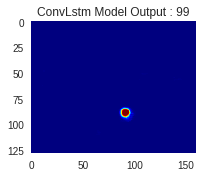

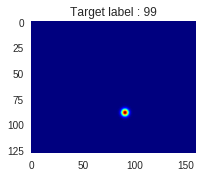

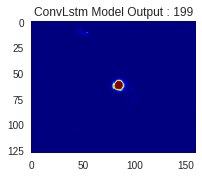

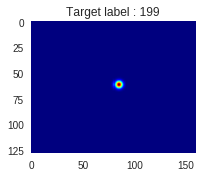

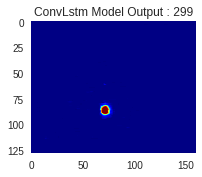

...

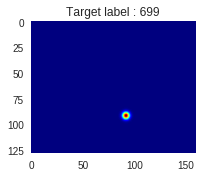

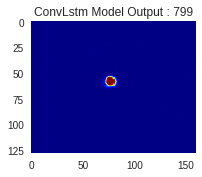

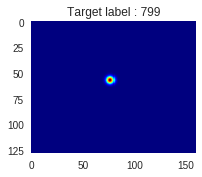

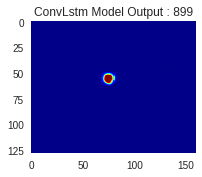

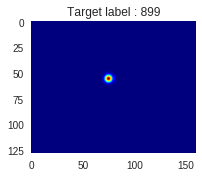

In [38]:
train_conv_lstm() 

In [0]:
#Save the convlstm model
with open ('convlstm_model_pickle.pkl','wb') as f:
  pickle.dump(convlstm,f)

In [0]:
#Load the saved model
with open('convlstm_model_pickle.pkl','rb') as f:
  model_convlstm = pickle.load(f)

**Test data for both sweatynet-1 and convLSTM model**

In [0]:
#Test data
img_folder3 = "3"
data3 = "Test_data_257_images"
data_folder_test = os.path.join(data_dir,img_folder3,data3)
if not os.path.exists(data_folder_test):
  os.mkdir(os.path.join(data_dir,img_folder3))
  os.mkdir(data_folder_test)
zip_handler = zipfile.ZipFile("Test_data_257_images.zip","r")
zip_handler.extractall(data_folder_test)

In [0]:
transformations_testdata = transforms.Compose([transforms.ToTensor()])
test_dataset = Datasets('test_data_257.txt',os.path.join(data_dir,img_folder3,data3), transformations_testdata)

In [28]:
print(len(test_dataset))
batch_size = 20 #batchsize for encoder decoder
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size,shuffle=False)

257


In [0]:
text_read = pd.read_csv('test_data_257.txt',skiprows=3 )

**Calculating recall and FDR**

In [0]:
def rec_fdr(label_x, label_y, model_x, model_y):
  TP_ = 0
  FP_ = 0
  FN_ = 0
  TN_ = 0
  
  if model_x == label_x == model_y == label_y == 0:
    TN_ += 1
  elif ((model_x == 0 and label_x != 0) and (model_y == 0 and label_y != 0)):
    FN_ += 1
  elif ((model_x != 0 and label_x == 0) and (model_y != 0 and label_y == 0)):
    FP_ += 1    
  elif ((model_x == label_x or abs(label_x - model_x) <=6) and (model_y == label_y or abs(label_y-model_y) <=6)):
    TP_ += 1  
  else:
    FP_ += 1
    
  return(TP_, FP_, FN_)
  

In [0]:
def  calc_batchwise_recall_fdr(labels, output, j):
  TP_ = 0
  FP_ = 0
  FN_ = 0
    
  for  i in range(labels.shape[0]):
    label_x_center = int(float(text_read.iloc[j, 0].split('|')[8]))
    label_y_center = int(float(text_read.iloc[j, 0].split('|')[9]))
    label_x_center = label_x_center//4
    label_y_center = label_y_center//4
     
    im_pic = output[i].cpu().numpy()
    im_pic = Image.fromarray(im_pic*255)
                     
    im_pic = im_pic.convert('L')
    im_pic.save('im_pic.jpg')
    im = cv.imread('im_pic.jpg')
    imgray = cv.cvtColor(im, cv.COLOR_BGR2GRAY)
    thresh = cv.threshold(imgray, 8, 255, cv.THRESH_BINARY)[1]
    im2, contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    
    b = cv.drawContours(im2, contours, -1, (0,255,0), 3)
    
    if len(np.where(b!=0)[0]) == 0:
      x_center = 0
      y_center = 0
    else:
      y_set = list(set(np.where(b!=0)[0]))
      x_set = list(set(np.where(b!=0)[1]))
      x_center = x_set[len(x_set)//2]
      y_center = y_set[len(y_set)//2]
    
    x,y,z = rec_fdr(label_x_center, label_y_center, x_center, y_center)
    TP_ += x
    FP_ += y
    FN_ += z
    j += 1

  return(TP_, FP_, FN_, j)

In [0]:
def test_encoder_decoder():
  TP = 0
  FP = 0
  FN = 0
  j = 0   
  recall = 0
  fdr = 0
  count = 0
  print("Visualising Encoder Decoder Output")
  for images,labels in test_loader:
    if cuda:
      images = Variable(images).cuda()
      labels = Variable(labels.float()).cuda()
    else:
      images = Variable(images)
      labels = Variable(labels.float())
    
    output = model(images)
    if cuda:
      output = Variable(output.float()).cuda()
    else:
      output = Variable(output.float()).cuda()
    
    x,y,z,jj = calc_batchwise_recall_fdr(labels, output, j)
    TP += x
    FP += y
    FN += z
    j = jj 
 
  j = 0
  k = 0
  for i in range(labels.shape[0]*3):
    plt.figure(figsize=(40,40))
    plt.subplot(3,labels.shape[0],i+1)
    plt.subplots_adjust(right=1.8, top=2.0)
    if i <= labels.shape[0]-1: 
      plt.title('Target Labels {}'.format(i))
      plt.imshow(labels[i].cpu().reshape(128,160),cmap='jet')
      plt.grid(False)
    elif(i>labels.shape[0]-1 and i<=labels.shape[0]+labels.shape[0]-1):
      plt.title('Model Output{}'.format(k))
      plt.imshow(output[k].cpu().reshape(128,160),cmap='jet')
      plt.grid(False)
      k += 1
    else:
      tensor = images.detach().cpu().numpy()
      plt.imshow(tensor[j].transpose((1,2,0)))
      plt.grid(False)
      plt.title('image{}'.format(j))
      j += 1
    

  #print('TP,FP,FN : ', TP,FP,FN)  
  recall = TP/(TP+FN)
  fdr = FP/(FP+TP)
  print("Recall : {}, FDR: {}".format(recall,fdr))

In [0]:
def test_convLSTM():
  TP = 0
  FP = 0
  FN = 0
  
  recall = 0
  fdr = 0
  batch_size=1
  test_convlstm_dataset = stack_encoder_decoder_output(test_dataset)
  test_convlstm_loader = torch.utils.data.DataLoader(dataset=test_convlstm_dataset, batch_size=batch_size,shuffle=False)
  seq_len = 10          # sequence length
  i=0
  step = 0
  recall = 0
  fdr = 0
  count = 0
  print("Visualising ConvLSTM Output")
  for inputs,labels in test_convlstm_loader:
    hidden_state = None
    k=i
    for j in range(seq_len-1):
      k=k+1
      if k<len(test_convlstm_dataset):
        inputs = torch.cat([inputs,test_convlstm_dataset[k][0].unsqueeze(0)],dim = 0)
        labels = torch.cat([labels,test_convlstm_dataset[k][1].unsqueeze(0)],dim = 0)
     
    labels = labels[-1:] # 1*1*128*160
    inputs = inputs.unsqueeze(0) # 5-D input tensor 1*10*1*128*160
    out = model_convlstm(inputs,hidden_state)
    model_output = out[1][0][0]
    
    i=i+1
    step = step+1
    if(step%20==0):
      visualise_convlstm_output(model_output,labels,i)
    
    model_output = model_output.squeeze(0)
    labels = labels.squeeze(0)
    
    if cuda:
      model_output = Variable(model_output.float()).cuda()
    else:
      model_output = Variable(model_output.float()).cuda()
    
    if k<len(test_convlstm_dataset):
      x,y,z, _ = calc_batchwise_recall_fdr(labels, model_output, k)
      TP += x
      FP += y
      FN += z
    
  #print('TP,FP,FN : ', TP,FP,FN)  
  recall = TP/(TP+FN)
  fdr = FP/(FP+TP)
  print("Recall : {}, FDR: {}".format(recall,fdr))

Visualising Encoder Decoder Output
Recall : 0.927038626609442, FDR: 0.1
Visualising ConvLSTM Output
Recall : 0.9419642857142857, FDR: 0.10212765957446808


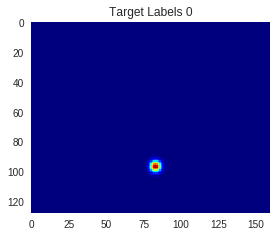

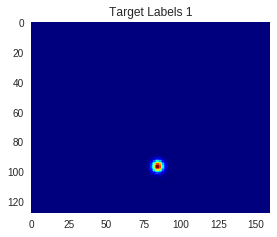

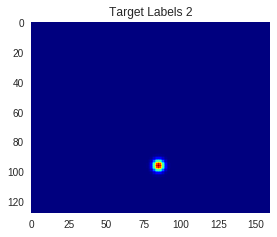

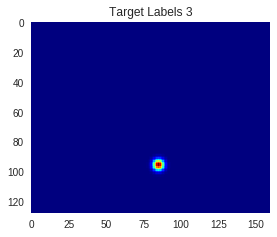

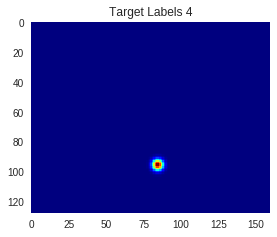

...

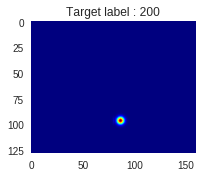

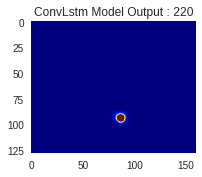

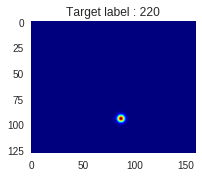

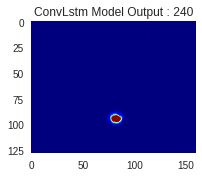

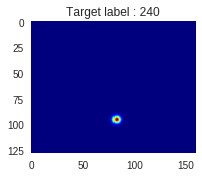

In [76]:
if __name__ == "__main__":
  test_encoder_decoder()
  test_convLSTM() 